# 이미지 전처리 관련 작업 학습

mnist, cifar-10과 같이 텐서플로우가 제공하는 데이터는 이미 이미지에 필요한 전처리가 진행된 상태이다. 

1. 실제 데이터를 바로 사용하게되면 데이터의 일관적인 '특징'을 찾기가 어렵다. 

    분류의 경우, 학습 데이터의 특징들을 검출해내고 해당 특징들을 통해 분류 예측을 실시하지만 데이터들의 일관적인 '특징'을 위해 적당한 전처리가 필요하다.이미지 전체에서 얼굴을 잘라내거나, 필요한 부분들만 잘라내거나 필요하지 않은 부분은 까맣게 변하게 한다던가, 우리가 원하는 '특징'들만 학습할 수 있도록 이미지 에 대한 처리를 수행한다.
    
2. 오버피팅을 피하는 방법으로 data augmentation을 수행한다.

    '데이터 증강'이라는 의미로 이미지의 데이터의 경우, 데이터 수집이 어렵기 떄문에 반복의 횟수를 늘려서 학습을 진행한다. 이 때, 데이터는 동일하되 반복(epoch)의 횟수를 늘리게 되면 overfitting이 발생하게 된다. 즉, 학습 데이터의 정확도는 올라가지만 학습 데이터에 대해서만 학습이 제대로 진행되기 떄문에 평가 데이터의 정확도는 오히려 떨어지는 현상이 발생한다. 이 때, 이미지에 대해 약간의 변형들을 주어서 마치 새로운 그림을 만드는 것과 같은 효과로 이미지를 바꾸어 학습을 진행

이러한 작업을 수행하기 위해서 이미지 전처리하는 방법들을 배워본다.


# PIL

python image library라는 뜻, image를 다루기 위한 python의 기초적인 라이브러리

- jupyter 환경에 적합하다.
- The Python Imaging Library uses a coordinate system with (0, 0) in the upper left corner.
> 좌표 체계가 왼쪽 위가 (0,0)이다. -> 행렬과 동일하다고 생각하면 된다. 
- 이미지에 대한 기본적인 변환이나 전처리 등이 가능하다.

### Image 객체

property
- .size 이미지의 사이즈
- .mode 컬러모드



(500, 375)
RGB


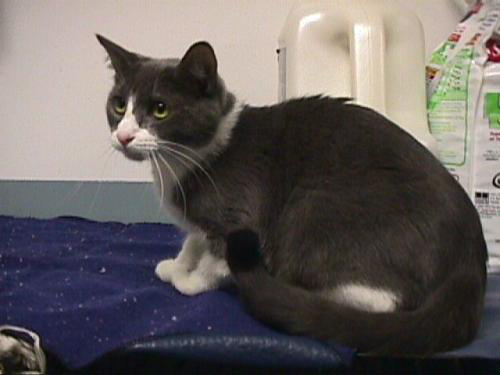

In [3]:
# 위의 image.load_img와 동일하다. 하지만 저걸 쓰는 이유는? -> PIL 라이브러리를 따로 불러올 필요가 없다.
from PIL import Image

image = Image.open('./dataset/pets/Cat/4.jpg')
#display(im)

print(image.size)
print(image.mode)
image

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x1FBBB570388>


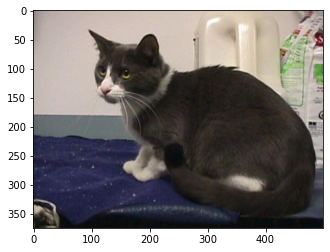

In [6]:
import matplotlib.pyplot as plt

# 이미지의 데이터를 그대로 불러올 수 없기 때문에 
# plt.imshow('./dataset/pets/Cat/4.jpg')

plt.imshow(image)

## crop

기준 이미지에서 좌표만큼 잘라내는 함수  
인자로는 (left, upper, right, lower) -> 왼쪽 위 좌표, 오른쪽 아래 좌표 를 사용한다.
> 반드시 직사각형의 범위만 잘라낼 수 있다.


### (left, upper, right, lower)
PIL의 여러가지 함수들이 이러한 좌표 포맷을 사용한다.  
일반적인 위 좌표(x, y) 오른쪽 좌표 (x, y)가 아니라 (y, x) (y, x)의 형태이다.


In [20]:
point = [100, 100, 200, 200]

cropped_image = image.crop(point)

## paste

이미지에 이미지를 붙이는 함수 

In [24]:
# 좌 상 우 하
image.paste(cropped_image, (0, 0, 100, 100))

# 
image.paste(cropped_image, (200, 200, 300, 300))

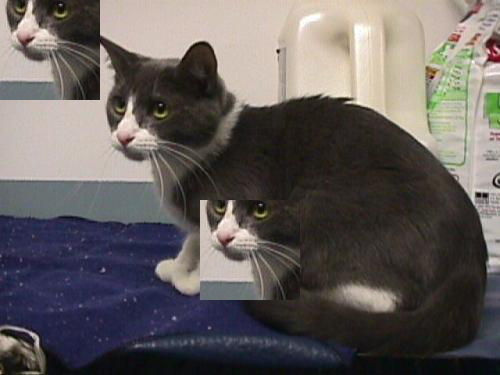

In [25]:
image

## transpose

PIL에서 미리 정해둔 변환들을 수행하는 함수
- 좌우/상하반전, 90/180/270 회전변환등이 있다. -> 대응되는 정수 값도 있다.
- 일반적인 rotate는 따로 있다.

## rotate


파라미터 
- angle  
    회전할 각도
  
  
- resample  
    이미지의 크기나 모양이 변경될 때 픽셀값을 구하는 방식을 정의
    
    
- expand  
    이미지를 확장할 것인가 아닌가를 정의  
    기본적으로 False이기 때문에 입력의 이미지와 크기가 동일하다.
        
       
- fillcolor  
    추가되는 여분의 픽셀의 색깔을 정의

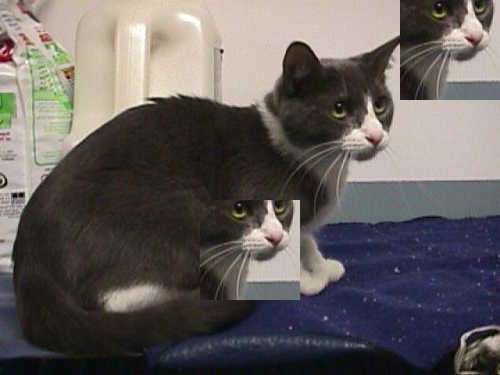

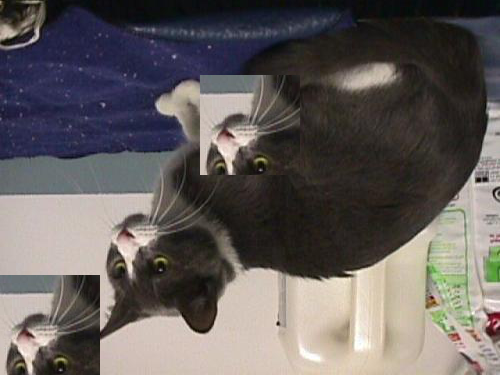

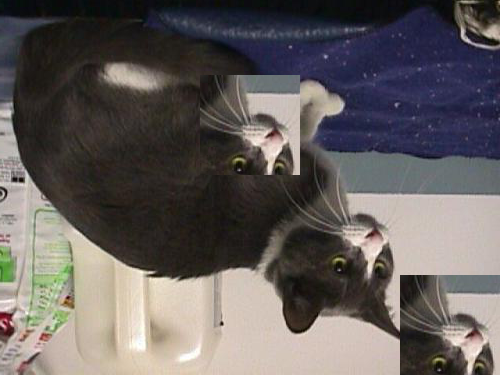

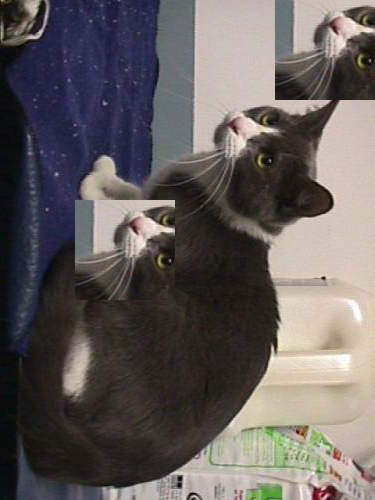

In [26]:
# 좌우 반전
lr_image = image.transpose(Image.FLIP_LEFT_RIGHT)
display(lr_image)

tb_image = image.transpose(Image.FLIP_TOP_BOTTOM)
display(tb_image)

image_180 = image.transpose(Image.ROTATE_180)
display(image_180)

image_270 = image.transpose(Image.ROTATE_270)
display(image_270)

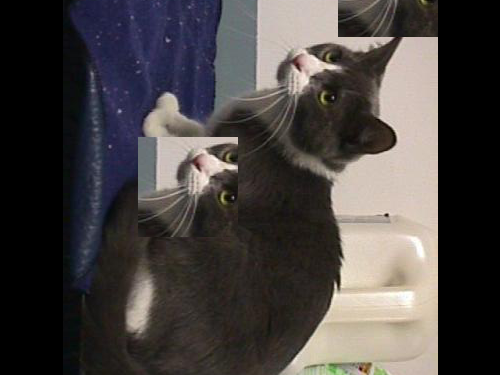

In [27]:
# rotate
image.rotate(180)

# 다른 점이 있다면 shape가 변하지 않는다.
rotate_270_image = image.rotate(270, fillcolor='blue')
rotate_270_image

# 기본적으로 NEAREST을 사용한다. -> 인접한 픽셀값을 사용한다.
rotate_270_image = image.rotate(270)
rotate_270_image

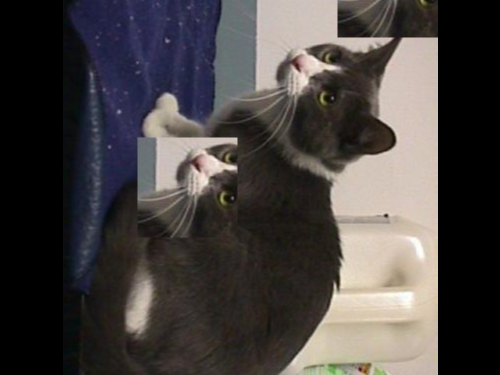

In [28]:
# 선형 보간법을 통해 픽셀을 채운 이미지
rotate_270_image = image.rotate(270, resample=Image.BILINEAR)
rotate_270_image

## resize

이미지의 크기를 변경하는 함수  

resizing에 필요한 여러가지 고려사항 
- 이미지의 축소시에 어떤 픽셀을 선택할 것인가?
- 여백의 픽셀은 어떻게 구성할 것인가?  


파라미터
- size  
    변경하기 위한 크기
    
- resample    
    PIL.Image.BICUBIC을 기본적으로 사용
    속도가 중요하기 때문에 속도/퀄리티별 


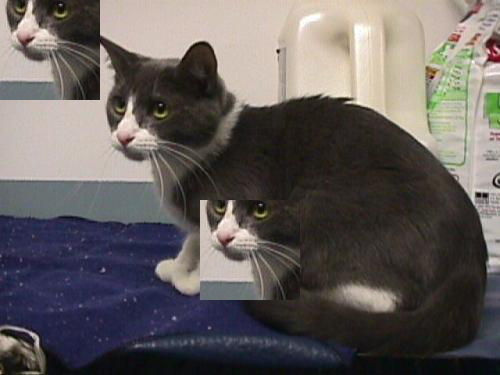

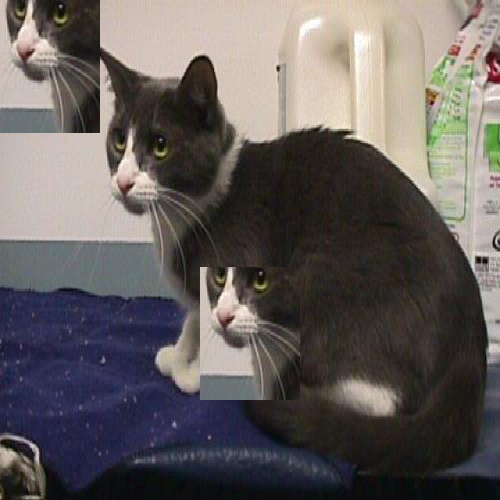

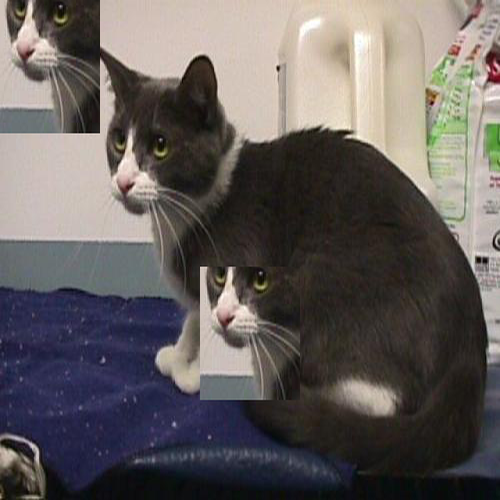

In [29]:
image.resize((224,224))
display(image)

display(image.resize((500, 500), resample=Image.NEAREST))
display(image.resize((500, 500), resample=Image.LANCZOS))

# 어쨌든 이미지의 축소, 확장이 가능하다. 

# Image transform (변환)



PIL은 python에서 기본적으로 사용하는 image 관련 library이다. PIL 라이브러리에서 이미지 변환 기능까지 제공한다. 하지만 실제로 사용하기에는 전문가가 아닌 이상 어렵고, 대신 OpenCV가 여러가지 이미지 처리에 대한 도구를 쉽게 사용할 수 있도록 제공하기 때문에 OpenCV를 사용하는 것이 좋다. 실제로 이미지 분석을 하는 Computer Vision 분야에서는 OpenCV가 널리 쓰인다.

왜 PIL에서는 사용하기 어려운가?

> 변환에 대응되는 행렬을 구해야하는데 OpenCV에서 처럼 제공하지 않기 때문에 직접 변환행렬을 구해야한다.


### 1. Affine 변환. 

  선의 평행성은 유지되는 변환

### 2. Perspective 변환. 

  원근법 변환으로, 직선의 성질만 유지가 되고, 선의 평행성은 유지가 되지 않는 변환


In [30]:
from PIL import ImageDraw
from PIL import Image
import matplotlib.pyplot as plt


In [59]:
trash_image = Image.open('./education_images/IMG_3018.jpg')
trash_image.size

(4032, 3024)

In [61]:
trash_image = trash_image.transpose(Image.ROTATE_270)
# display(trash_image)

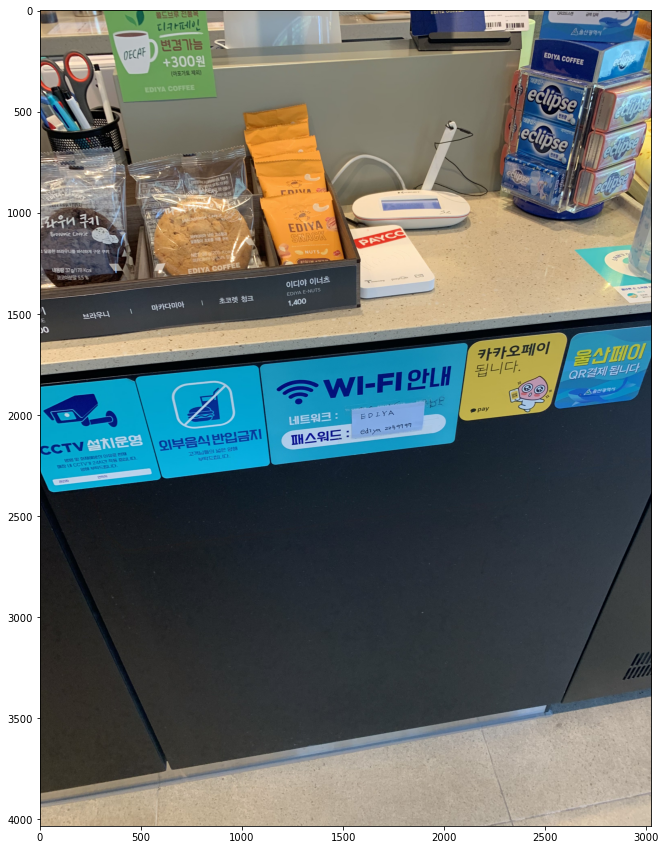

In [80]:
# 요렇게 축을 보고 위치를 계산한다.
plt.figure(figsize=(15, 15))
plt.imshow(trash_image)

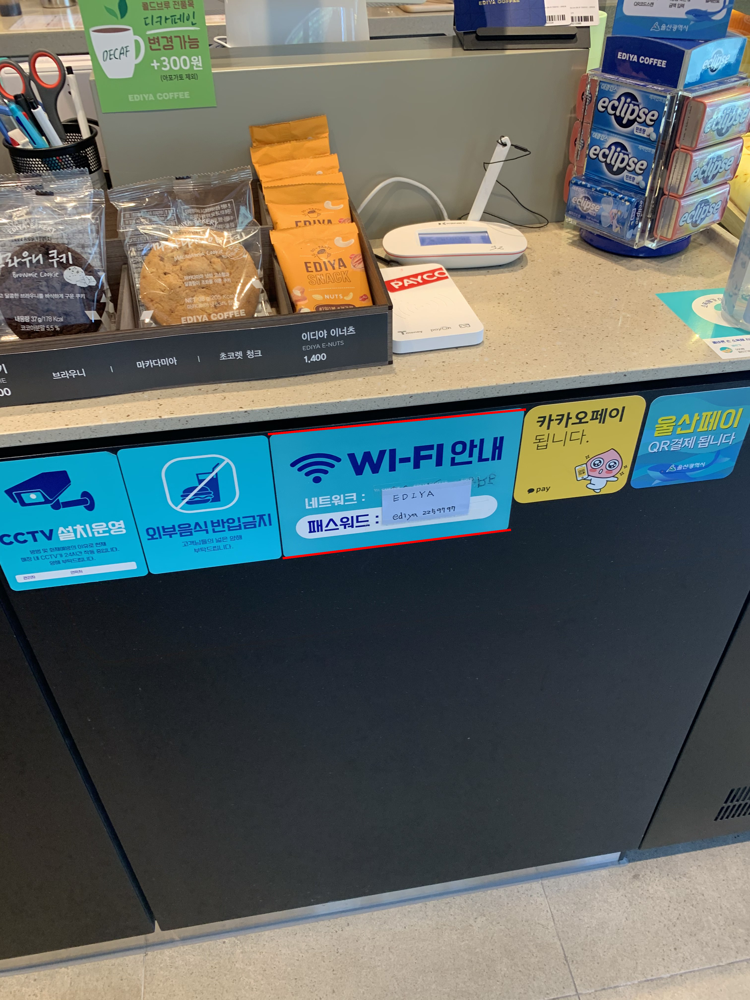

In [75]:
trash_image = Image.open('./education_images/IMG_3018.jpg')
trash_image = trash_image.transpose(Image.ROTATE_270)
with trash_image as image:
    draw = ImageDraw.Draw(image)
    # 포인트를 맞춰뒀다.
    # 좌상, 우상
    # x, y
    draw.line((1080, 1750, 2120, 1650), fill='red', width = 10)
    # 좌하, 우하
    draw.line((1140, 2250, 2060, 2135), fill='red', width = 10)
    
display(image)

In [77]:
import numpy
# 좌표를 변환하는 행렬이 반드시 필요하다. -> 이 행렬을 구하는 공식이 있는데 이 작업을 자신이 구현해야한다. -> opencv에서는 그냥 준다.
def find_coeffs(pa, pb):
    matrix = []
    for p1, p2 in zip(pa, pb):
        matrix.append([p1[0], p1[1], 1, 0, 0, 0, -p2[0]*p1[0], -p2[0]*p1[1]])
        matrix.append([0, 0, 0, p1[0], p1[1], 1, -p2[1]*p1[0], -p2[1]*p1[1]])

    A = numpy.matrix(matrix, dtype=numpy.float)
    B = numpy.array(pb).reshape(8)

    res = numpy.dot(numpy.linalg.inv(A.T * A) * A.T, B)
    return numpy.array(res).reshape(8)

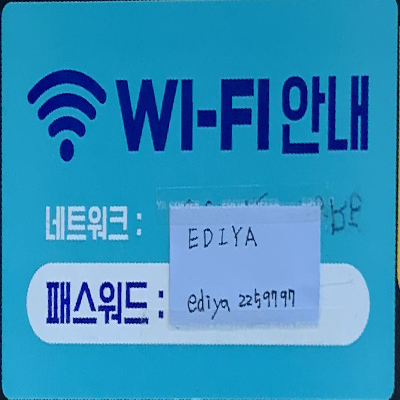

In [79]:
coeffs = find_coeffs(
        # 좌하 좌상 우상 우하 
        [(0, 400), (0, 0), (400, 0), (400, 400)],
        [(1140, 2250), (1080, 1750),(2120, 1650), (2060, 2135)])

trash_image = Image.open('./education_images/IMG_3018.jpg')
trash_image = trash_image.transpose(Image.ROTATE_270)
trash_image.transform((400, 400), Image.PERSPECTIVE, coeffs)

# OpenCV로 구하기

In [ ]:
import cv2 
image = cv2.imread('./education_images/IMG_3018.jpg')
# 그냥 띄우면 너무 커서 안된다.
image = cv2.resize(image, (960, 1280), cv2.INTER_LANCZOS4)  
window_name = "1-th pic"

def draw_circle(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        cv2.circle(image,(x,y), 3, (0,0,255),-1)
        print(x, y)
        
cv2.namedWindow(window_name)
cv2.setMouseCallback(window_name, draw_circle)


while True:
    cv2.imshow(window_name, image)
    if cv2.waitKey(1) & 0xFF == ord('q'): break
cv2.destroyAllWindows()

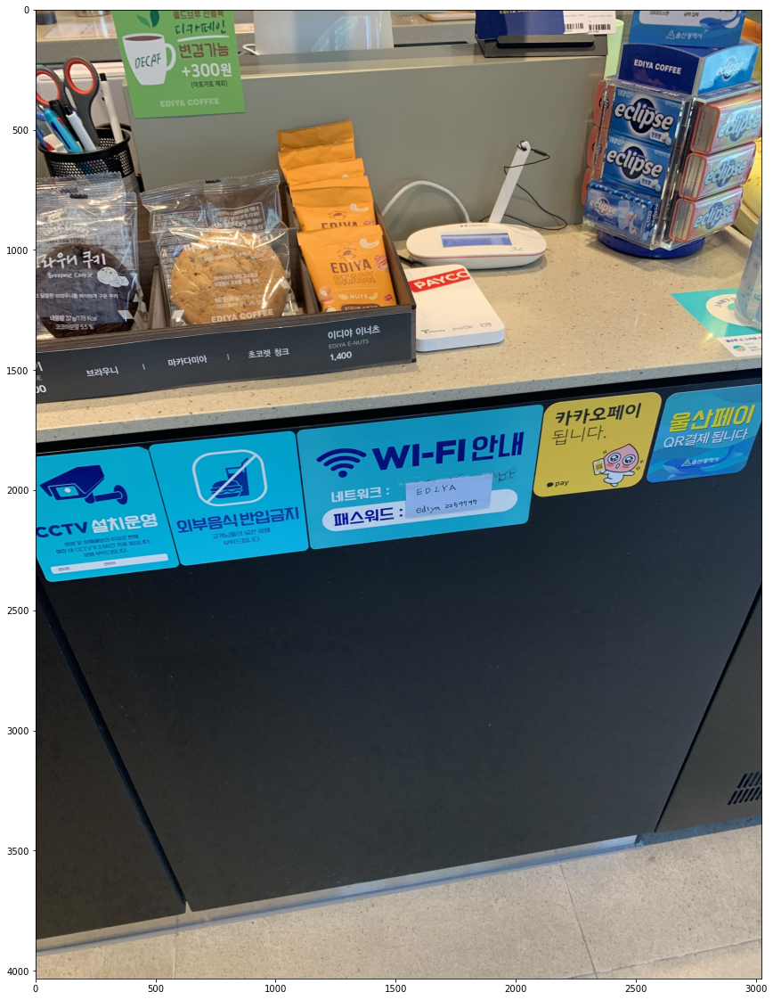

In [86]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# cv2의 좌표계는 왼쪽 상단이 (0,0)이기 떄문에 조금 다르다.
image = cv2.imread('./education_images/IMG_3018.jpg')
# image = cv2.resize(image, (960, 1280), cv2.INTER_LANCZOS4)  
b, g, r = cv2.split(image)   # img파일을 b,g,r로 분리
image = cv2.merge([r,g,b]) # b, r을 바꿔서 Merge

# # 좌상
cv2.circle(image, (1090, 1750), 20, (255,0,0),-1)
# # 우상
cv2.circle(image, (2100,1650), 20, (0,255,0),-1)
# # 좌하
cv2.circle(image, (1150,2250), 20, (0,0,255),-1)
# # 우하
cv2.circle(image, (2070,2130), 20, (255,255,255),-1)


# figsize의 단위가 매우 크더라..
plt.figure(figsize=(20,20))
plt.imshow(image)

# 좌표점은 좌상->좌하->우상->우하
pts1 = np.float32([(1090, 1750), (1150,2250), (2100,1650), (2050,2130)])


# 좌표의 이동점
pts2 = np.float32([(0, 0), (0, 400), (400,0), (400, 400)])

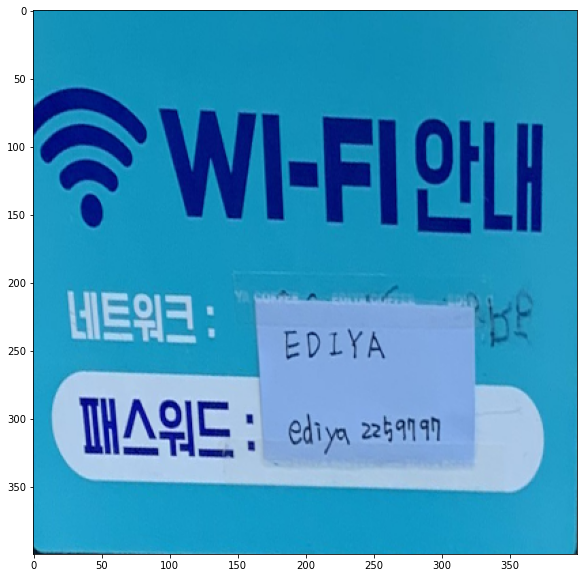

In [87]:
M = cv2.getAffineTransform(pts1[1:], pts2[1:])
dst = cv2.warpAffine(image, M, (400,400))
plt.figure(figsize=(10,10))
plt.imshow(dst)

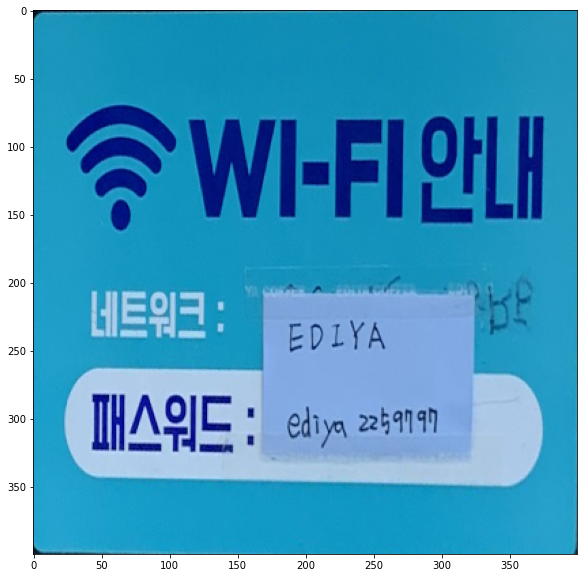

In [88]:
# matrix를 구하는 함수가 따로 존재한다.
M = cv2.getPerspectiveTransform(pts1, pts2)
dst = cv2.warpPerspective(image, M, (400, 400))
plt.figure(figsize=(10,10))
plt.imshow(dst)

# OpenCV로 가능한 것?

- 얼굴 및 물체 인식류도 이미 가능합니다.

In [95]:
import cv2

# haarcascade 불러오기
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

# 이미지 불러오기
img = cv2.imread('./dataset/test5.jpeg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 얼굴 찾기
faces = face_cascade.detectMultiScale(gray, 1.3, 5)
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # 눈 찾기
    roi_color = img[y:y + h, x:x + w]
    roi_gray = gray[y:y + h, x:x + w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

# 영상 출력
cv2.imshow('image', img)

key = cv2.waitKey(0)
cv2.destroyAllWindows()